In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [2]:
df = pd.read_csv("data/patient_information.csv")

In [3]:
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)
df = df.drop_duplicates()
#df = df.drop(['LOG_ID','DISCH_DISP_C','DISCH_DISP','LOS','ICU_ADMIN_FLAG','BIRTH_DATE','HEIGHT','WEIGHT','SEX','PRIMARY_ANES_TYPE_NM','ASA_RATING_C','ASA_RATING','PATIENT_CLASS_GROUP','PATIENT_CLASS_NM','PRIMARY_PROCEDURE_NM'], axis=1)
df = df[['MRN','HOSP_ADMSN_TIME','HOSP_DISCH_TIME','SURGERY_DATE','IN_OR_DTTM','OUT_OR_DTTM','AN_START_DATETIME','AN_STOP_DATETIME']]

number of duplicate rows:  (1364, 23)


In [4]:
df['MRN'] = df['MRN'].astype("string")
df['HOSP_ADMSN_TIME'] = pd.to_datetime(df['HOSP_ADMSN_TIME'], format="%m/%d/%y %H:%M") 
df['HOSP_DISCH_TIME'] = pd.to_datetime(df['HOSP_DISCH_TIME'], format="%m/%d/%y %H:%M") 
df['SURGERY_DATE'] = pd.to_datetime(df['SURGERY_DATE'], format="%m/%d/%y %H:%M") 
df['IN_OR_DTTM'] = pd.to_datetime(df['IN_OR_DTTM'], format="%m/%d/%y %H:%M")  
df['OUT_OR_DTTM'] = pd.to_datetime(df['OUT_OR_DTTM'], format="%m/%d/%y %H:%M") 
df['AN_START_DATETIME'] = pd.to_datetime(df['AN_START_DATETIME'], format="%m/%d/%y %H:%M")  
df['AN_STOP_DATETIME'] = pd.to_datetime(df['AN_STOP_DATETIME'], format="%m/%d/%y %H:%M") 

In [5]:
df['HOSP_Duration'] = (df['HOSP_DISCH_TIME'] - df['HOSP_ADMSN_TIME']).dt.total_seconds() / 3600
df['OPER_Duration'] = (df['OUT_OR_DTTM'] - df['IN_OR_DTTM']).dt.total_seconds() / 3600
df['ANES_Duration'] = (df['AN_STOP_DATETIME'] - df['AN_START_DATETIME']).dt.total_seconds() / 3600

In [6]:
df.dropna(subset=['HOSP_DISCH_TIME'], inplace=True)

Algorithm 1

In [7]:
def surgery_type(row):
    # Check if all specified columns are null
    if pd.isnull(row[['IN_OR_DTTM', 'OUT_OR_DTTM', 'AN_START_DATETIME', 'AN_STOP_DATETIME']]).all():
        # Check if the difference between admission time and surgery date is greater than one day
        if (row['HOSP_ADMSN_TIME'] - row['SURGERY_DATE']) > dt.timedelta(days=1):
            return 'Surgery Date Passed'
        else:
            return 'Surgery Cancelled'
    else:
        return 'Surgery Performed'

# Apply the function to create the 'SURGERY_TYPE' column
df['SURGERY_TYPE'] = df.apply(surgery_type, axis=1)

Algorithm 2

In [8]:
def times(p):
  if p['SURGERY_TYPE'] == 'Surgery Date Passed':
    plan_time = p['SURGERY_DATE']
    cancel_time = p['SURGERY_DATE']

  if p['SURGERY_TYPE'] == 'Surgery Performed':
    cancel_time = ''
    if p['SURGERY_DATE'] <= p['HOSP_ADMSN_TIME']:
      plan_time = p['HOSP_ADMSN_TIME'] + dt.timedelta(minutes=1)
    else:
      plan_time = p['SURGERY_DATE']

  if p['SURGERY_TYPE'] == 'Surgery Cancelled':
    plan_time = p['HOSP_ADMSN_TIME'] + dt.timedelta(minutes=1)
    if p['SURGERY_DATE'] + dt.timedelta(hours=23, minutes=59) >= p['HOSP_DISCH_TIME']:
      cancel_time = p['HOSP_DISCH_TIME'] - dt.timedelta(minutes=1)
    else:
      cancel_time = p['SURGERY_DATE'] + dt.timedelta(hours=23, minutes=59)
  return plan_time, cancel_time

df['SRG_PLN_TIME'], df['SRG_CNL_TIME'] = df.apply(times, axis=1, result_type='expand').T.values

In [9]:
df = df.sort_values(by=['MRN','HOSP_ADMSN_TIME','HOSP_DISCH_TIME'])

**CREATE EVENT LOG**

event logs from patient information.csv

In [10]:
admsn = pd.DataFrame({'patient':df.MRN, 'action':'Hospital Admission', 'datetime':df['HOSP_ADMSN_TIME']})
disch = pd.DataFrame({'patient':df.MRN, 'action':'Hospital Discharge', 'datetime':df['HOSP_DISCH_TIME']})
or_in = pd.DataFrame({'patient':df.MRN, 'action':'Operating Room Enter', 'datetime':df['IN_OR_DTTM']})
or_out = pd.DataFrame({'patient':df.MRN, 'action':'Operating Room Exit', 'datetime':df['OUT_OR_DTTM']})
an_start = pd.DataFrame({'patient':df.MRN, 'action':'Anesthesia Start', 'datetime':df['AN_START_DATETIME']})
an_stop = pd.DataFrame({'patient':df.MRN, 'action':'Anesthesia Stop', 'datetime':df['AN_STOP_DATETIME']})
planned = pd.DataFrame({'patient':df.MRN, 'action':'Surgery Planned', 'datetime':df['SRG_PLN_TIME']})
cancelled_rows = df[df.SURGERY_TYPE == 'Surgery Cancelled']
cancelled = pd.DataFrame({'patient':cancelled_rows.MRN, 'action':'Surgery Cancelled', 'datetime':cancelled_rows['SRG_CNL_TIME']})
passed_rows =  df[df.SURGERY_TYPE == 'Surgery Date Passed']
passed = pd.DataFrame({'patient':passed_rows.MRN, 'action':'Surgery Passed', 'datetime':passed_rows['SRG_PLN_TIME']})

In [11]:
events = pd.concat([admsn, disch, or_in, or_out, an_start, an_stop, planned, cancelled, passed])
events = events.sort_values(by=['patient','datetime','action'])
events = events.drop_duplicates()
events = events.dropna(axis=0)

**PROCESS MINING**

In [12]:
import pm4py

In [13]:
from pm4py.objects.conversion.log import converter as log_converter

# process mining
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.algo.filtering.log.attributes import attributes_filter
from pm4py.algo.filtering.log.variants import variants_filter

# viz
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer
from pm4py.visualization.dfg import visualizer as dfg_visualization

# misc
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.objects.conversion.dfg import converter as dfg_mining
from pm4py.statistics.traces.generic.log import case_statistics


In [14]:
log = pm4py.format_dataframe(events, case_id='patient', activity_key='action', timestamp_key='datetime', timest_format=None)

activities = attributes_filter.get_attribute_values(log, "concept:name")
start_activities = pm4py.get_start_activities(log)
end_activities = pm4py.get_end_activities(log)

In [15]:
print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

Start activities: {'Hospital Admission': 39671, 'Anesthesia Start': 6, 'Surgery Passed': 3, 'Operating Room Enter': 3}
End activities: {'Hospital Discharge': 39573, 'Anesthesia Stop': 22, 'Operating Room Exit': 88}


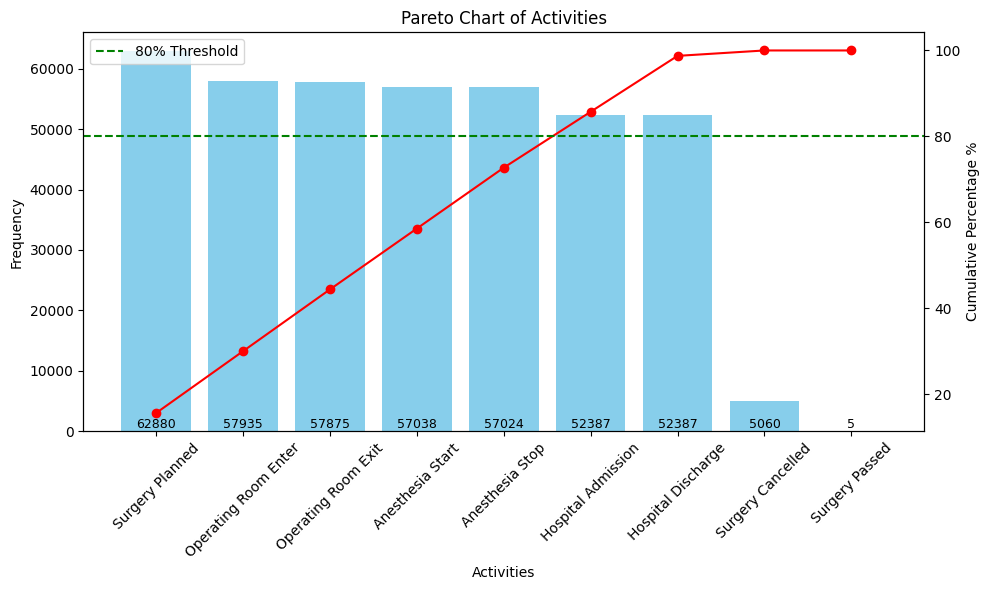

In [16]:
import matplotlib.pyplot as plt # type: ignore
import numpy as np # type: ignore

# Sorting data for Pareto chart
sorted_activities = dict(sorted(activities.items(), key=lambda item: item[1], reverse=True))
activity_names = list(sorted_activities.keys())
activity_values = list(sorted_activities.values())

# Cumulative sum for Pareto
cumulative_values = np.cumsum(activity_values)
cumulative_percentage = 100 * cumulative_values / cumulative_values[-1]

# Plotting
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar chart (activities)
bars = ax1.bar(activity_names, activity_values, color='skyblue')
ax1.set_xlabel('Activities')
ax1.set_ylabel('Frequency')
ax1.tick_params(axis='x', rotation=45)

# Adding text (values) below each bar
for bar, value in zip(bars, activity_values):
    ax1.text(bar.get_x() + bar.get_width() / 2, 100, f'{value}', ha='center', va='bottom', fontsize=9, rotation=0)

# Line chart (cumulative percentage)
ax2 = ax1.twinx()
ax2.plot(activity_names, cumulative_percentage, color='red', marker='o', linestyle='-')
ax2.set_ylabel('Cumulative Percentage %')
ax2.axhline(80, color='green', linestyle='--', label='80% Threshold')
ax2.legend()

plt.title('Pareto Chart of Activities')
plt.tight_layout()
plt.show()

**Heuristic Miner**

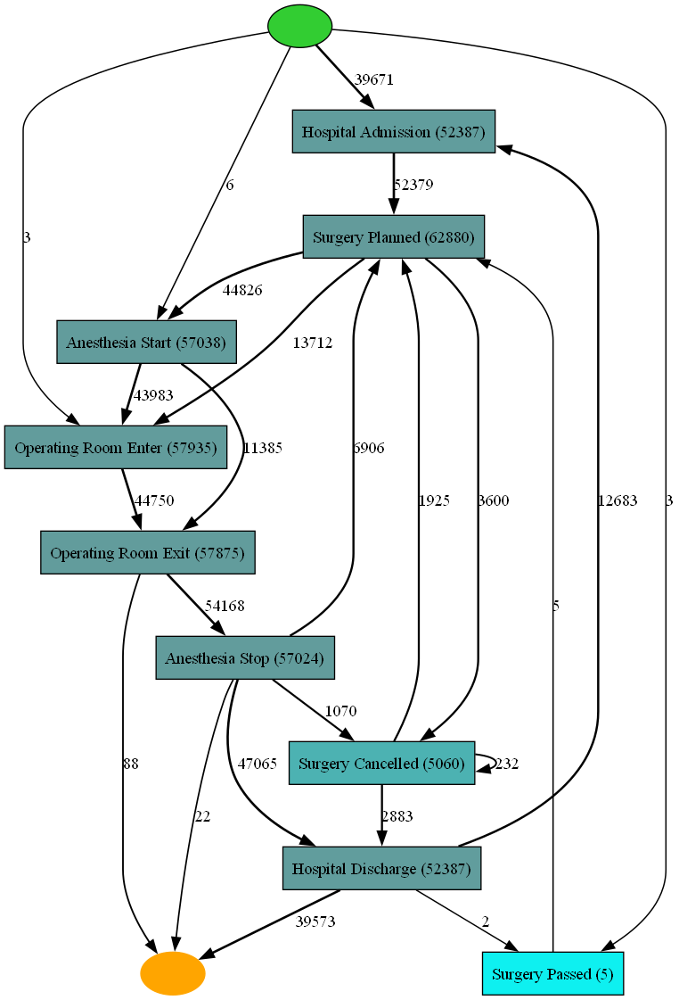

In [17]:
import graphviz

heu_net = heuristics_miner.apply_heu(log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.5})
gviz = hn_visualizer.apply(heu_net)
hn_visualizer.view(gviz)

***Petri-net of heuristic miner output (FREQUENCY)***

replaying log with TBR, completed traces ::   0%|          | 0/2635 [00:00<?, ?it/s]

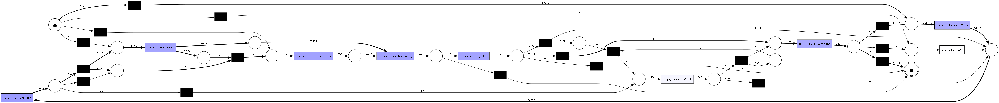

In [18]:
net, im, fm = heuristics_miner.apply(log)
parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
# viz
gviz = pn_visualizer.apply(net, im, fm,
                           parameters=parameters,
                           variant=pn_visualizer.Variants.FREQUENCY,
                           log=log)
pn_visualizer.view(gviz)

**Direct Flow Graph Frequency**

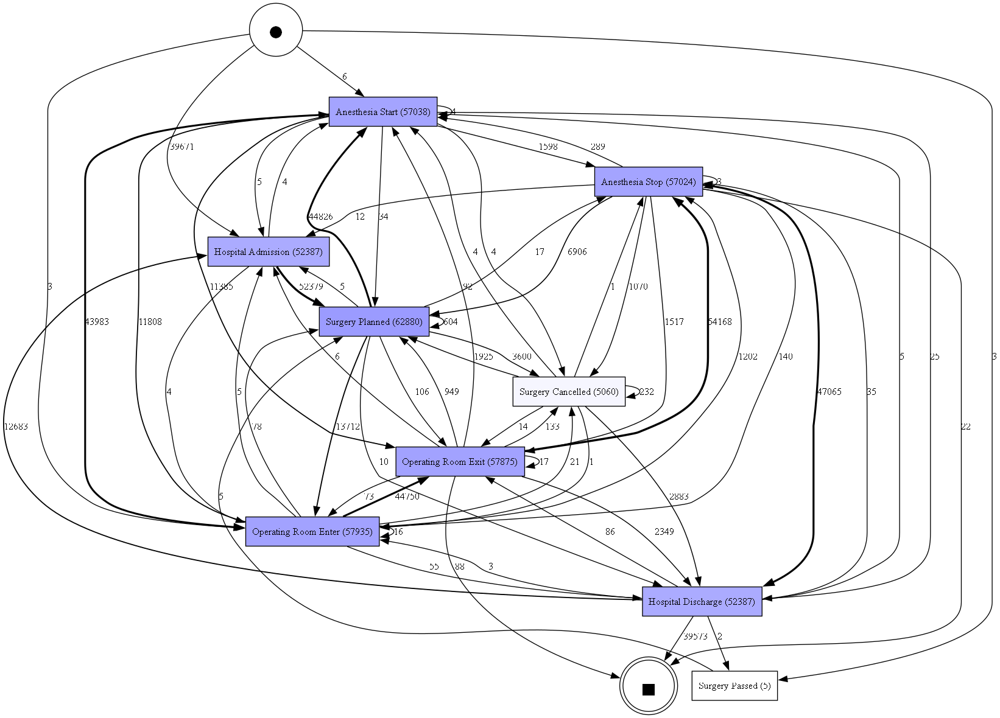

In [19]:
dfg, start_activities, end_activities = pm4py.discover_dfg(log)
pm4py.view_dfg(dfg, start_activities, end_activities, rankdir='TB')

**Direct Flow Graph Performance**

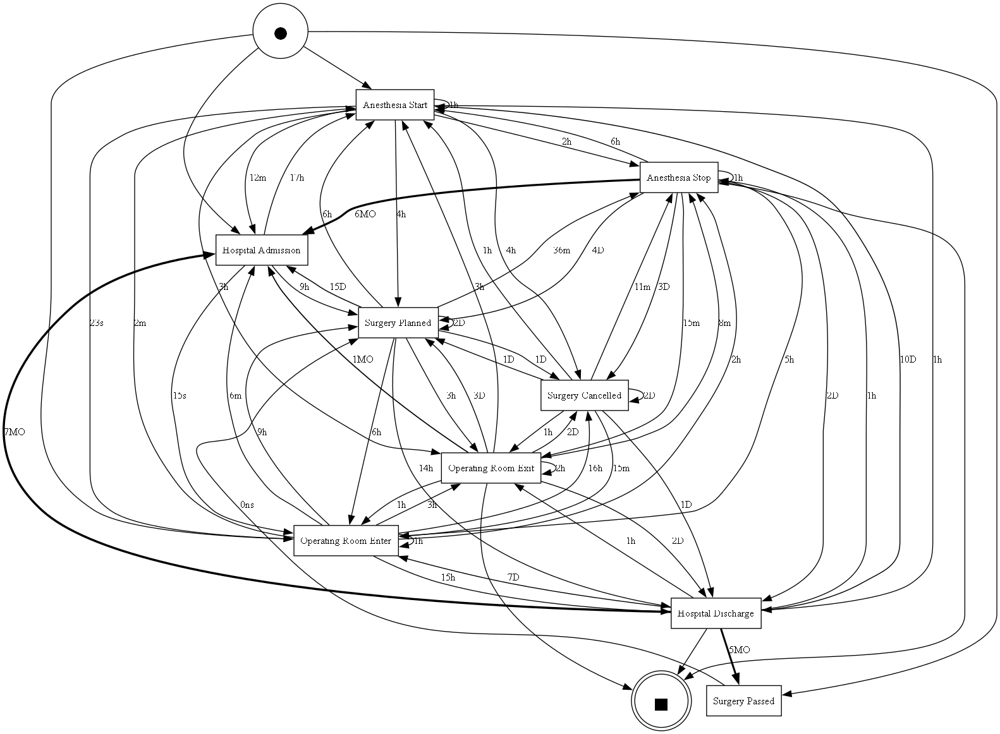

In [20]:
performance_dfg, start_activities, end_activities = pm4py.discover_performance_dfg(log)
pm4py.view_performance_dfg(performance_dfg, start_activities, end_activities, rankdir="TB")

**Convert Directly-Follows Graph to a Workflow Net**

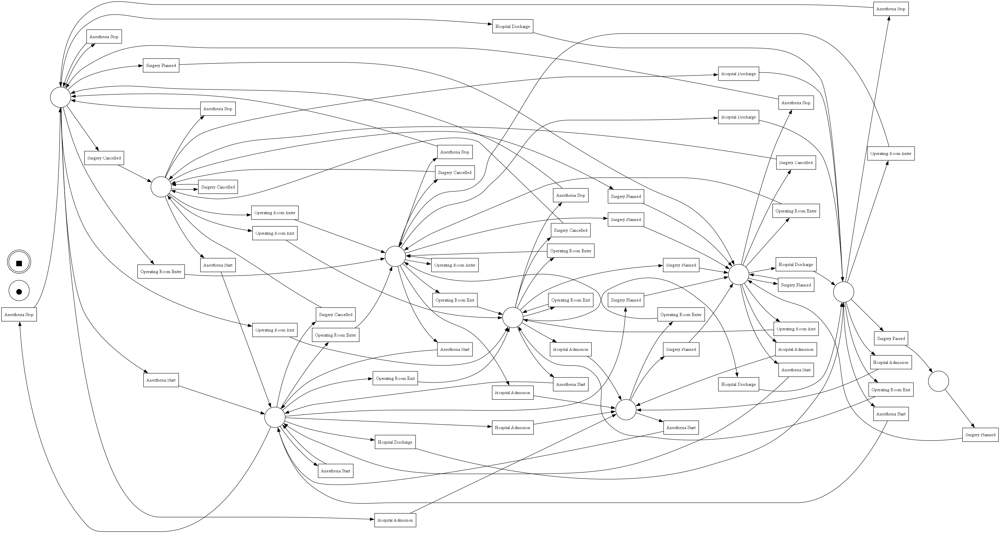

In [21]:
net, im, fm = dfg_mining.apply(performance_dfg)
gviz = pn_visualizer.apply(net, im, fm)
pn_visualizer.view(gviz)

**Inductine Miner Tree**

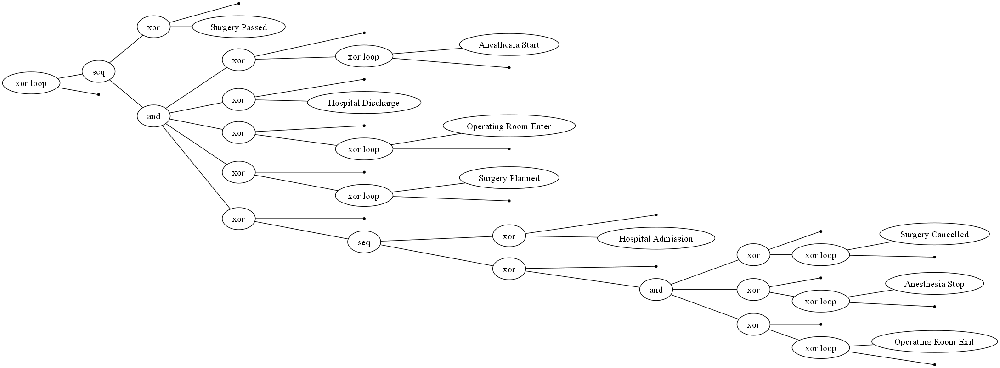

In [22]:
# create the process tree ( Inductive miner)
tree = inductive_miner.apply(log)

gviz = pt_visualizer.apply(tree)
pt_visualizer.view(gviz)

***In case you want to Convert the inductive miner into petri-net***

replaying log with TBR, completed traces ::   0%|          | 0/2635 [00:00<?, ?it/s]

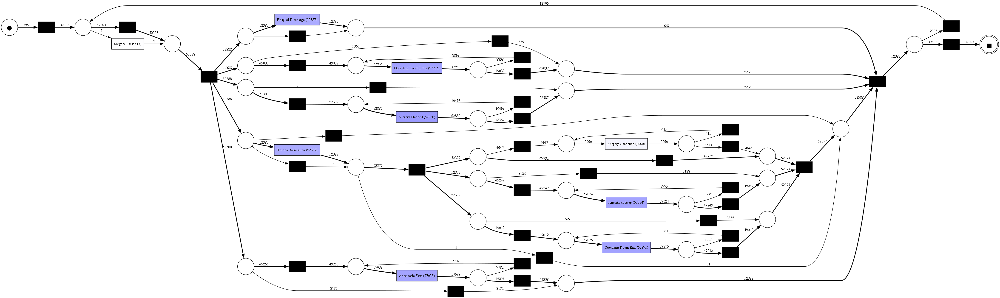

In [23]:
# convert the process tree to a petri net
net, initial_marking, final_marking = pt_converter.apply(tree)

# alternatively, use the inductive_miner to create a petri net from scratch
#net, initial_marking, final_marking = inductive_miner.apply(log)

# viz
parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
gviz = pn_visualizer.apply(net, initial_marking, final_marking,
                           parameters=parameters,
                           variant=pn_visualizer.Variants.FREQUENCY,
                           log=log)
pn_visualizer.view(gviz)

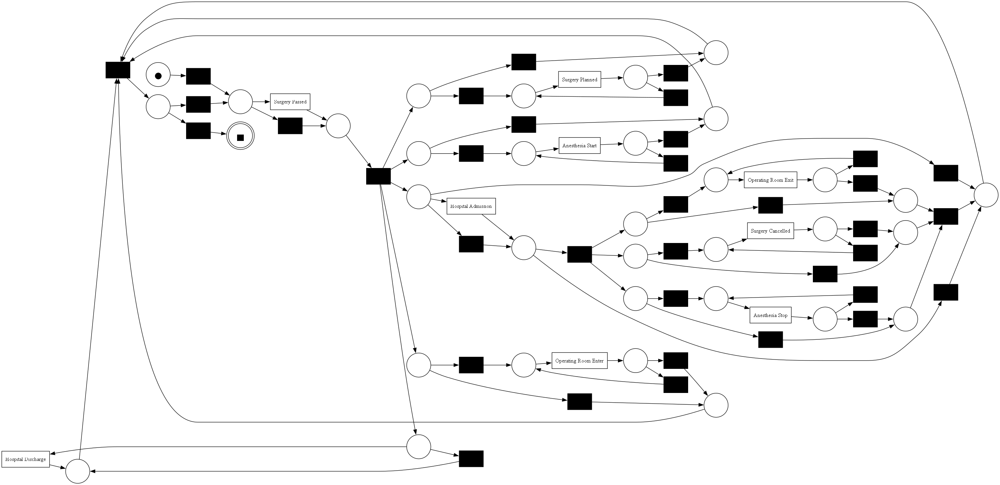

In [24]:
# Step 1: Discover process model using Inductive Miner
petri_net, initial_marking, final_marking = pm4py.discover_petri_net_inductive(log)

# Visualize the discovered Petri net
pm4py.view_petri_net(petri_net, initial_marking, final_marking)

In [25]:
# Step 2: Perform conformance checking with token-based replay
replay_result = pm4py.conformance_diagnostics_token_based_replay(log, petri_net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/2635 [00:00<?, ?it/s]

In [ ]:
# Check the conformance statistics
print("Conformance checking (token-based replay):")
for i in replay_result:
    print(i)

In [27]:
# we compare the original log versus the discovered model
fitness = pm4py.fitness_token_based_replay(log, petri_net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/2635 [00:00<?, ?it/s]

In [28]:
print("Fitness Values:")
print(fitness)

Fitness Values:
{'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}


In [29]:
# we compare the original log versus the discovered model
precision = pm4py.precision_token_based_replay(log, petri_net, initial_marking, final_marking)
print(precision) # 0.4593725046653312

replaying log with TBR, completed traces ::   0%|          | 0/28965 [00:00<?, ?it/s]

0.4593725046653312


In [30]:
################## BE CAREFULL ' it is taking too long
# we check if the discovered model is a sound workflow net
#### is_sound_wfnet = pm4py.check_soundness(petri_net, initial_marking, final_marking)[0]
#### print(is_sound_wfnet) # True

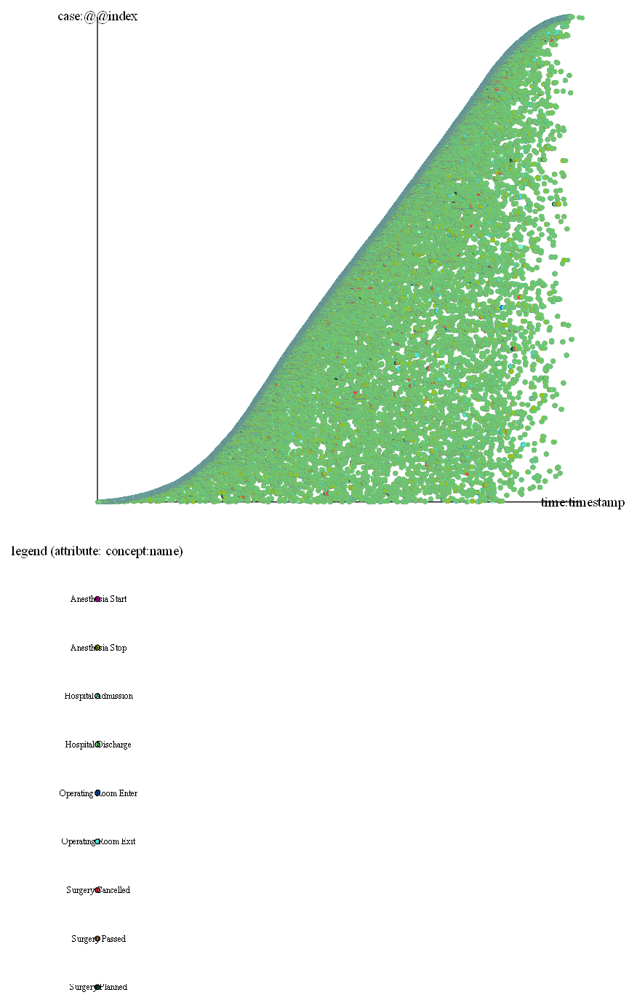

In [31]:
pm4py.view_dotted_chart(log)

**Statistical Analysis**

In [32]:
# Calculate the duration of each case (from admission to discharge)
case_durations = case_statistics.get_all_case_durations(log, parameters={
    case_statistics.Parameters.TIMESTAMP_KEY: 'datetime',
    case_statistics.Parameters.CASE_ID_KEY: 'patient'
})

In [33]:
# Extract unique case IDs from the event log
case_ids = log.groupby('patient').first().index.tolist()

# Combine case IDs and durations into a DataFrame
case_durations_df = pd.DataFrame(list(zip(case_ids, case_durations)), columns=['Case ID', 'Duration'])

# Convert Duration from milliseconds to hours (or desired time unit)
case_durations_df['Duration (hours)'] = case_durations_df['Duration'] / (1000 * 60 * 60)

In [34]:
# Display case duration statistics using describe()
print(case_durations_df['Duration (hours)'].describe())

count    39683.000000
mean         1.748771
std          4.963042
min          0.000667
25%          0.020092
50%          0.067533
75%          0.318583
max         41.525250
Name: Duration (hours), dtype: float64


**VARIANTS EXPLORER**

In [35]:
variants = variants_filter.get_variants(log)

In [36]:
num_variants = len(variants)
num_variants

2635

In [ ]:
# Step 2: Get variant statistics
variants_count = case_statistics.get_variant_statistics(log)
variants_count = sorted(variants_count, key=lambda x: x['count'], reverse=True)
## Printing the top 10 variants by case number
variants_count[:10]

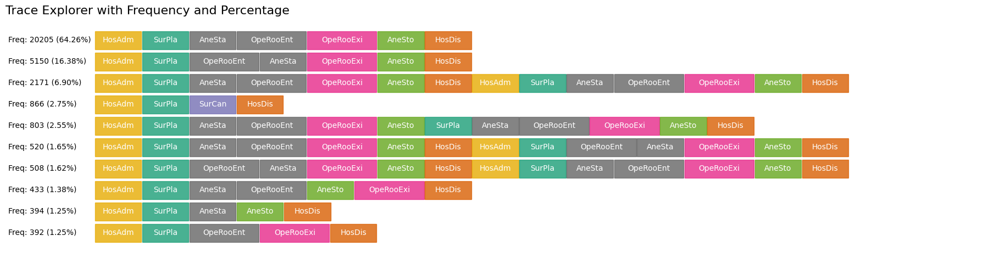

In [38]:
# Step 3: Extract unique activities
all_events = set()
for variant in variants_count:
    events = variant['variant']
    all_events.update(events)

# Step 4: Assign a distinct color to each activity
distinct_colors = plt.colormaps['Dark2']  # Use a colormap for distinct colors
activity_colors = {event: distinct_colors(i) for i, event in enumerate(all_events)}

# Step 5: Get top variants (adjust the number as needed)
top_variants = variants_count[:10]  # No longer limited to top 10

# Step 6: Prepare data for visualization
variant_names = [variant['variant'] for variant in top_variants]
frequencies = [variant['count'] for variant in top_variants]

# Convert tuple of activities to a string
variant_names = [' -> '.join(variant) for variant in variant_names]

# Step 7: Calculate the total frequency and percentage for each variant
total_frequency = sum(frequencies)
percentages = [(freq / total_frequency) * 100 for freq in frequencies]

# Set font size
font_size = 10
char_width = 0.015 * font_size  # Adjusted character width for better box sizing
padding = 0.05  # Padding around the text inside the box

# Step 8: Calculate dynamic figure size
num_variants = len(top_variants)
max_variant_length = max(len(''.join([word[:3] for word in variant.split()])) for variant in variant_names)
fig_width = 0.15 * max_variant_length  # Adjust width based on longest variant
fig_height = 0.5 * num_variants  # Adjust height to accommodate all variants

plt.figure(figsize=(fig_width, fig_height))

y_offset = 0  # Starting position for the y-axis

for i, (variant_events, frequency, percentage) in enumerate(zip(variant_names, frequencies, percentages)):
    events = variant_events

    x_offset = 0.05  # Reset x_offset for each row (each variant)

    # Add frequency value and percentage at the beginning of the row
    plt.text(x_offset, y_offset + 0.15, f"Freq: {frequency} ({percentage:.2f}%)",
             fontsize=font_size, va='center', ha='left', color='black')

    # Update x_offset to move past the frequency text
    x_offset += 1.7  # Adjust the space for frequency text and percentage

    for event in events.split(' -> '):
        # Get the color assigned to this specific event/activity
        event_color = activity_colors[event]

        # Display the first three letters of each word in the event
        short_event_name = ''.join([word[:3] for word in event.split()])  # Take the first 3 letters of each word

        # Calculate the width based on the length of the short event name
        box_width = char_width * len(short_event_name) + 0.05 * padding  # Width based on number of characters plus padding
        box_height = 0.3  # Box height for the row

        # Create a colored rectangle for each event in the variant
        rect = patches.Rectangle((x_offset, y_offset), box_width, box_height, color=event_color, alpha=0.8)
        plt.gca().add_patch(rect)

        # Add text to the center of the rectangle with padding
        plt.text(x_offset + padding + box_width / 2 - padding, y_offset + box_height / 2, short_event_name,
                 fontsize=font_size, va='center', ha='center', color='white')

        # Move the x_offset to the right for the next event in the row
        x_offset += box_width + 0.02  # Adding a small space between boxes

    # Move the y_offset down for the next row (next variant)
    y_offset -= 0.35  # Adjust the vertical spacing

# Step 9: Set limits and remove axes
plt.xlim(0, fig_width + 1)
plt.ylim(y_offset, 0.5)  # Adjust limits for visibility
plt.axis('off')  # Hide axes for cleaner visualization

# Manually adjust the margins
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)  # Adjust margins as needed

# Step 10: Show the plot
plt.title('Trace Explorer with Frequency and Percentage', fontsize=16, loc='left')
plt.tight_layout()
plt.show()

***Distribution of Events over the Hours***



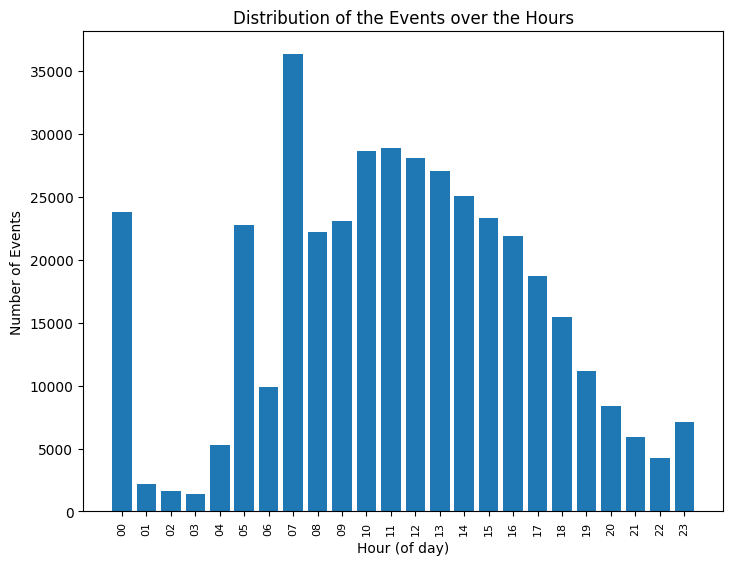

In [39]:
pm4py.view_events_distribution_graph(log, distr_type='hours', activity_key='action', case_id_key='patient', timestamp_key='datetime')

In [40]:
op_df = df[["MRN","IN_OR_DTTM","OUT_OR_DTTM"]]
op_df = op_df.dropna(axis=0)
op_df = op_df.drop_duplicates()
# Calculate the duration for each patient in hours
op_df['Duration_Hours'] = (op_df['OUT_OR_DTTM'] - op_df['IN_OR_DTTM']).dt.total_seconds() / 3600

In [41]:
# Plot the boxplot for each hour
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import timedelta

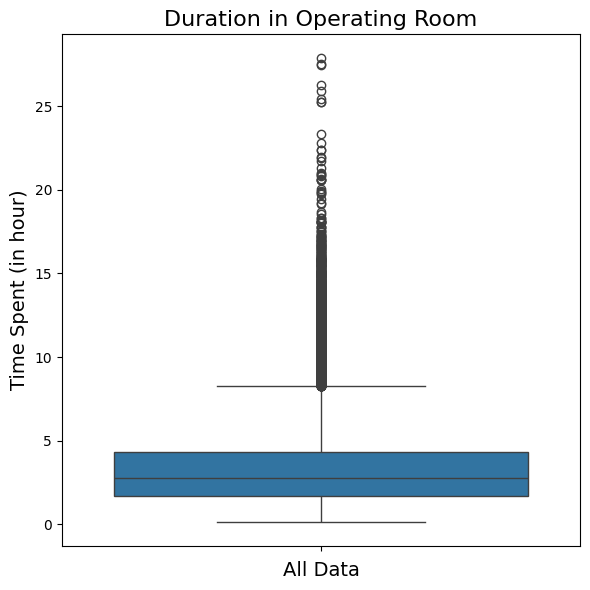

In [42]:
plt.figure(figsize=(6, 6))
sns.boxplot(y='Duration_Hours', data=op_df)
#sns.boxplot(y='Duration_Hours', hue='Duration_Hours', data=op_df, palette='Blues', dodge=False, legend=False)

# Label the plot
plt.xlabel('All Data', fontsize=14)
plt.ylabel('Time Spent (in hour)', fontsize=14)
plt.title('Duration in Operating Room', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

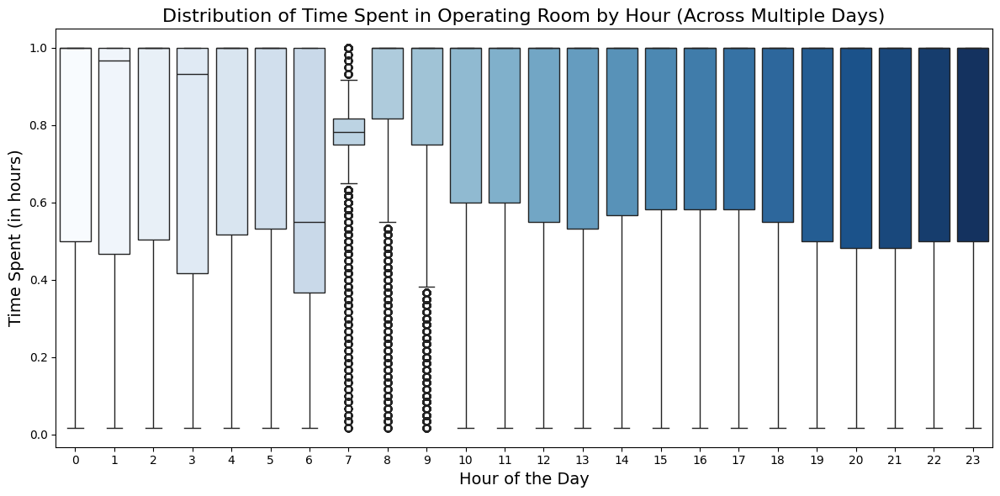

In [43]:
# Function to calculate the hourly distribution for each patient
def calculate_hourly_distribution_multi_day(op_df):
    hourly_distributions = []

    # Loop through each patient record
    for index, row in op_df.iterrows():
        in_time = row['IN_OR_DTTM']
        out_time = row['OUT_OR_DTTM']

        # Initialize an array to hold the time fractions for each hour (0-23) for this patient, for each day
        hourly_distribution = {}

        current_time = in_time

        while current_time < out_time:
            # Determine the hour and day of the current time
            hour = current_time.hour
            day = current_time.date()

            # Find the end of the current hour interval (next full hour)
            next_hour_time = (current_time + timedelta(hours=1)).replace(minute=0, second=0, microsecond=0)

            # Calculate the time spent in the current hour interval
            time_in_this_hour = min(out_time, next_hour_time) - current_time
            time_in_this_hour_minutes = time_in_this_hour.total_seconds() / 60.0  # Convert to minutes

            # Initialize if the day is not yet in the hourly_distribution dict
            if day not in hourly_distribution:
                hourly_distribution[day] = np.zeros(24)

            # Add the fraction of the hour spent to the corresponding day and hour
            hourly_distribution[day][hour] += time_in_this_hour_minutes / 60.0  # Convert to hour fraction

            # Move to the next hour
            current_time = next_hour_time

        # Append the patient's hourly distribution to the list
        hourly_distributions.append(hourly_distribution)

    return hourly_distributions

# Apply the function to calculate hourly distributions
hourly_distributions = calculate_hourly_distribution_multi_day(op_df)

# Convert the result into a DataFrame for further analysis
# We will create a list of records, one for each day/hour of occupancy
records = []

for i, distribution in enumerate(hourly_distributions):
    for day, hours in distribution.items():
        for hour, time_spent in enumerate(hours):
            if time_spent > 0:
                records.append({
                    'MRN': op_df.iloc[i]['MRN'],
                    'Date': day,
                    'Hour': hour,
                    'Time_Spent': time_spent
                })

# Create a DataFrame from the records
op_df_long = pd.DataFrame(records)

# Plot the boxplot for each hour
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.boxplot(x='Hour', y='Time_Spent', hue='Hour', data=op_df_long, palette='Blues', dodge=False, legend=False)

# Label the plot
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Time Spent (in hours)', fontsize=14)
plt.title('Distribution of Time Spent in Operating Room by Hour (Across Multiple Days)', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()


In [44]:
# Function to create a new DataFrame with hourly distribution
def create_hourly_df(op_df, hourly_distributions):
    # List to store rows for the new DataFrame
    records = []

    # Loop through each patient's hourly distribution
    for i, distribution in enumerate(hourly_distributions):
        in_time = op_df.iloc[i]['IN_OR_DTTM']
        out_time = op_df.iloc[i]['OUT_OR_DTTM']

        # For each day in the hourly distribution
        for day, hours in distribution.items():
            # Create a dictionary to store the row data
            row = {
                'MRN': op_df.iloc[i]['MRN'],
                'Date': day,
                'IN_OR_DTTM': in_time,
                'OUT_OR_DTTM': out_time
            }

            # Add time spent for each hour (Hour_00 to Hour_23)
            for hour in range(24):
                row[f'Hour_{hour:02}'] = hours[hour]

            # Append the row to the records list
            records.append(row)

    # Create a DataFrame from the records
    hourly_df = pd.DataFrame(records)

    return hourly_df

# Create the new DataFrame using the hourly distribution data
hourly_df = create_hourly_df(op_df, hourly_distributions)

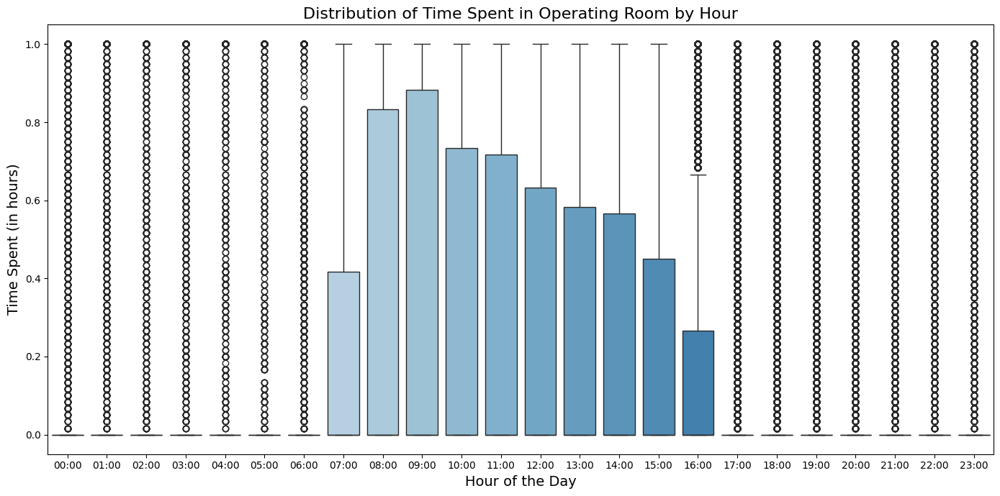

In [45]:
# Melt the DataFrame to long format so that each hour becomes a row
hour_columns = [f'Hour_{h:02}' for h in range(24)]
hourly_df_long = pd.melt(hourly_df,
                         id_vars=['MRN', 'Date', 'IN_OR_DTTM', 'OUT_OR_DTTM'],
                         value_vars=hour_columns,
                         var_name='Hour',
                         value_name='Time_Spent')

labels=[f'{h:02}:00' for h in hours]

# Convert 'Hour' to a more readable integer format (e.g., 'Hour_00' to 0)
hourly_df_long['Hour'] = hourly_df_long['Hour'].str.replace('Hour_', '').astype(int)
hourly_df_long['Hour'] = hourly_df_long['Hour'].apply(lambda h: f'{h:02}:00')

# Drop rows where Time_Spent is 0 (no time spent in that hour)
#hourly_df_long = hourly_df_long[hourly_df_long['Time_Spent'] > 0]

# Plot the boxplot for each hour
plt.figure(figsize=(14, 7))
sns.boxplot(x='Hour', y='Time_Spent', hue='Hour', data=hourly_df_long, palette='Blues', dodge=False, legend=False)

# Label the plot
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Time Spent (in hours)', fontsize=14)
plt.title('Distribution of Time Spent in Operating Room by Hour', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

In [46]:
import plotly.express as px

# Ensure that the hourly_df_long is already created from the previous code (reshaping to long format)
# If not, use the same melting step here:

hour_columns = [f'Hour_{h:02}' for h in range(24)]
hourly_df_long = pd.melt(hourly_df,
                         id_vars=['MRN', 'Date', 'IN_OR_DTTM', 'OUT_OR_DTTM'],
                         value_vars=hour_columns,
                         var_name='Hour',
                         value_name='Time_Spent')

# Convert 'Hour' to a more readable integer format (e.g., 'Hour_00' to 0)
hourly_df_long['Hour'] = hourly_df_long['Hour'].str.replace('Hour_', '').astype(int)

# Create an interactive boxplot using Plotly
fig = px.box(hourly_df_long, x='Hour', y='Time_Spent',
             title='Distribution of Time Spent in Operating Room by Hour',
             labels={'Hour': 'Hour of the Day', 'Time_Spent': 'Time Spent (in hours)'},
             template='plotly_dark')

# Show the interactive plot
fig.show()


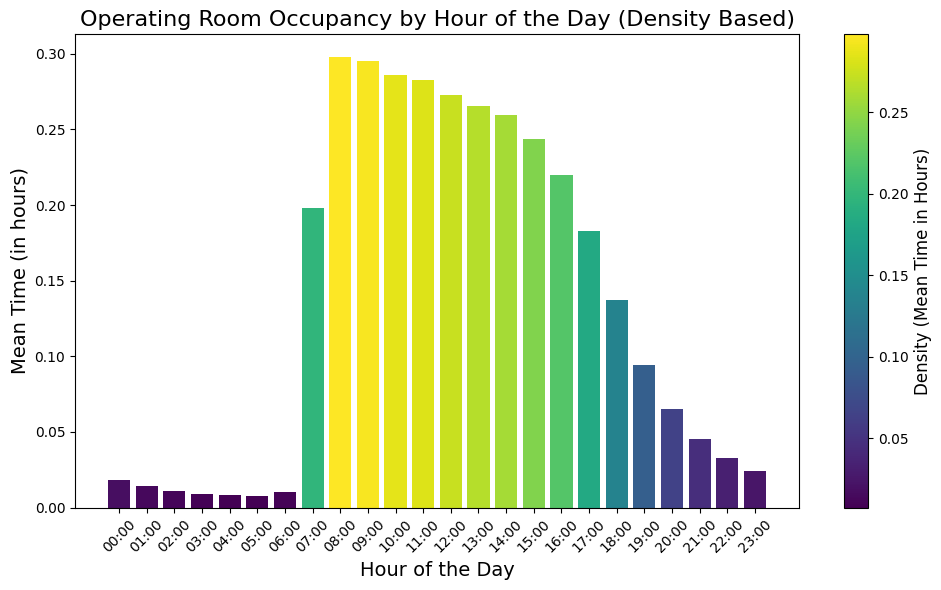

In [47]:
import matplotlib.pyplot as plt
import numpy as np

# Summing the hourly distribution across all patients
hourly_totals = hourly_df[[f'Hour_{h:02}' for h in range(24)]].mean()

# Normalize the density values to map them to a color gradient
norm = plt.Normalize(vmin=hourly_totals.min(), vmax=hourly_totals.max())

# Create a colormap (e.g., 'viridis' for density mapping)
cmap = plt.cm.viridis

# Apply the colormap to each bar according to the density (hourly total)
colors = cmap(norm(hourly_totals))

# Plotting the total operating room occupancy by hour with density-based color mapping
fig, ax = plt.subplots(figsize=(10, 6))

# X-axis: hours (0-23), Y-axis: total time spent in each hour (sum of fractions)
hours = np.arange(24)
bars = ax.bar(hours, hourly_totals, color=colors)

# Add colorbar to show the density scale
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(hourly_totals)
cbar = fig.colorbar(sm, ax=ax)  # Explicitly associate the colorbar with the axes
cbar.set_label('Density (Mean Time in Hours)', fontsize=12)

# Label the plot
ax.set_xlabel('Hour of the Day', fontsize=14)
ax.set_ylabel('Mean Time (in hours)', fontsize=14)
ax.set_title('Operating Room Occupancy by Hour of the Day (Density Based)', fontsize=16)
ax.set_xticks(hours)
ax.set_xticklabels([f'{h:02}:00' for h in hours], rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

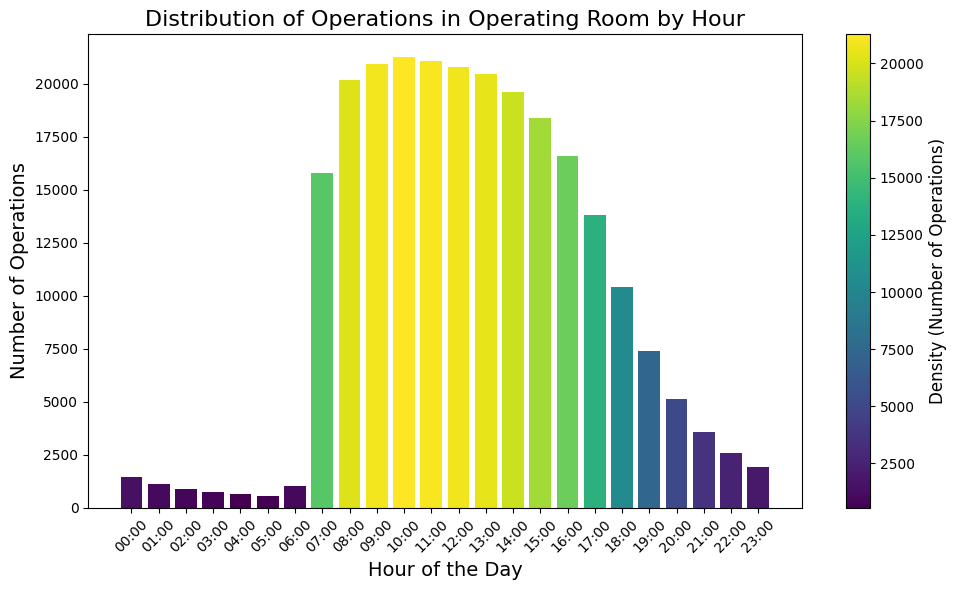

In [48]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Summing the hourly distribution across all patients
hourly_totals = np.count_nonzero(hourly_df[[f'Hour_{h:02}' for h in range(24)]], axis=0)

# Normalize the density values to map them to a color gradient
norm = plt.Normalize(vmin=hourly_totals.min(), vmax=hourly_totals.max())

# Create a colormap (e.g., 'viridis' for density mapping)
cmap = plt.cm.viridis

# Apply the colormap to each bar according to the density (hourly total)
colors = cmap(norm(hourly_totals))

# Plotting the total operating room occupancy by hour with density-based color mapping
fig, ax = plt.subplots(figsize=(10, 6))

# X-axis: hours (0-23), Y-axis: total time spent in each hour (sum of fractions)
hours = np.arange(24)
bars = ax.bar(hours, hourly_totals, color=colors)

# Add colorbar to show the density scale
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(hourly_totals)  # Set the array for ScalarMappable
cbar = fig.colorbar(sm, ax=ax)  # Explicitly associate the colorbar with the axes
cbar.set_label('Density (Number of Operations)', fontsize=12)

# Label the plot
ax.set_xlabel('Hour of the Day', fontsize=14)
ax.set_ylabel('Number of Operations', fontsize=14)
ax.set_title('Distribution of Operations in Operating Room by Hour', fontsize=16)
ax.set_xticks(hours)
ax.set_xticklabels([f'{h:02}:00' for h in hours], rotation=45)

# Show the plot
plt.tight_layout()
plt.show()